# Solar Flare Prediction

#### Import Packages

In [194]:
import re
import os
import glob
import pandas as pd
import statsmodels.api as sm
import matplotlib.pyplot as plt
import dateutil.parser
from numpy import *
import math
import scipy
from collections import OrderedDict as od
import scipy.stats
from scipy.stats import kurtosis
from sklearn.model_selection import validation_curve

#### CSV Dataset Path

In [3]:
path = %pwd
ARdataCSVlist = glob.glob(path + "/*.csv")

In [4]:
print path

/Users/ankush/ADM/solarFlareDataset


##### Load all time series in an ordered dictionary ar_data

In [5]:
ar_data = od()
# Load all time series in an  ordered dictionary

In [6]:
key_index=['event_type',
        'event_year',
        'event_month',
        'event_day',
        'event_hour',
        'event_minute',
        'lookback_hours',
        'span_hours',
        'flare_class']

##### Parse each time series to a pandas DataFrame

In [7]:
%%timeit
for ARdataCSV in ARdataCSVlist:
    CSVbaseName = os.path.basename(ARdataCSV)
    event_type_code = CSVbaseName[0]
    event_type = CSVbaseName[0:5] if event_type_code == 'f' else CSVbaseName[0:7]
    event_year = int(CSVbaseName[5:9] if event_type_code == 'f' else CSVbaseName[7:11])
    event_month = int(CSVbaseName[10:12] if event_type_code == 'f' else CSVbaseName[12:14])
    event_day = int(CSVbaseName[13:15] if event_type_code == 'f' else CSVbaseName[15:17])
    event_hour = int(CSVbaseName[16:18] if event_type_code == 'f' else CSVbaseName[18:20])
    event_minute = int(CSVbaseName[19:21] if event_type_code == 'f' else CSVbaseName[21:23])
    lookback_hours = int(CSVbaseName[26:28] if event_type_code == 'f' else CSVbaseName[28:30])
    span_hours = CSVbaseName[32:34] if event_type_code == 'f' else CSVbaseName[34:36]
    span_hours = int(span_hours[0] if span_hours[0] == '6' else span_hours)
    flare_class = CSVbaseName[-5:-4]
    ar_data[
        event_type,
        event_year,
        event_month,
        event_day,
        event_hour,
        event_minute,
        lookback_hours,
        span_hours,
        flare_class] = pd.read_csv(ARdataCSV,index_col=0,parse_dates=['TimeStamp'])

1 loop, best of 3: 4.47 s per loop


##### TimeSeries Key stored in a DataFrame

In [8]:
dd=pd.DataFrame(ar_data.keys(), columns=key_index)

#### Extract Labels
noflare => 0
    flare => 1 
        M => 0
        X => 1

In [9]:
twoClassLabels = dd['event_type'].apply(lambda x: 1 if x=='flare' else 0)

threeClassLabels = dd['flare_class'].apply(lambda x: 1 if x==u'X' else 0) + twoClassLabels


##### Extract Raw Feature Names

In [15]:
features=ar_data.values()[0].columns

#### Sampling Data based on extraction windows

In [16]:
span_hours=12
lookback_hours=12
dd_l12_s6=dd.query('lookback_hours==12 and span_hours==6')

dd_l12_s12=dd.query('lookback_hours==12 and span_hours==12')

dd_l12_s24=dd.query('lookback_hours==12 and span_hours==24')

dd_l24_s6=dd.query('lookback_hours==24 and span_hours==6')

dd_l24_s12=dd.query('lookback_hours==24 and span_hours==12')

dd_l24_s24=dd.query('lookback_hours==24 and span_hours==24')

In [17]:
def plotFeat(ar_data,feature):
    spans = [6,12,24]
    lookbacks = [12,24]

    color=['tomato','sandybrown','orangered','salmon','chocolate','lightcoral','forestgreen','lawngreen','indianred']
    event_col = 0
    prior_col = -3
    span_col = -2
    event_type = ['flare','noflare']

    fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(12, 8))

    for ax, span in zip(axes[0], spans):
        ax.set_title("Span "+str(span))

    for ax, lookback in zip(axes[:,0], lookbacks):
        ax.set_ylabel("Lookback "+str(lookback), rotation=90, size='large')

    for lookback in lookbacks:
        if lookback==12:
            for ax, span in zip(axes[0], spans):
                if span==6:
                    for key in dd_l12_s6.values:
                        df=ar_data[key[0],key[1],key[2],key[3],key[4],key[5], key[6], key[7], key[8]]
                        if key[0]=='flare':
                            if key[8]=='X':
                                ax.plot(list(df[feature]),color[2],label='Flare_X',linewidth=2.5, linestyle="--")
                            elif key[8]=='M':
                                ax.plot(list(df[feature]),color[1],label='Flare_M',linewidth=2.5, linestyle="-")
                        elif key[0]=='noflare':
                            ax.plot(list(df[feature]),color[-2],label='noFlare',linewidth=2.5, linestyle="-.")
                elif span==12:
                    for key in dd_l12_s12.values:
                        df=ar_data[key[0],key[1],key[2],key[3],key[4],key[5], key[6], key[7], key[8]]
                        if key[0]=='flare':
                            if key[8]=='X':
                                ax.plot(list(df[feature]),color[2],label='Flare_X',linewidth=2.5, linestyle="--")
                            elif key[8]=='M':
                                ax.plot(list(df[feature]),color[1],label='Flare_M',linewidth=2.5, linestyle="-")
                        elif key[0]=='noflare':
                            ax.plot(list(df[feature]),color[-2],label='noFlare',linewidth=2.5, linestyle="-.")
                elif span==24:
                    for key in dd_l12_s24.values:
                        df=ar_data[key[0],key[1],key[2],key[3],key[4],key[5], key[6], key[7], key[8]]
                        if key[0]=='flare':
                            if key[8]=='X':
                                ax.plot(list(df[feature]),color[2],label='Flare_X',linewidth=2.5, linestyle="--")
                            elif key[8]=='M':
                                ax.plot(list(df[feature]),color[1],label='Flare_M',linewidth=2.5, linestyle="-")
                        elif key[0]=='noflare':
                            ax.plot(list(df[feature]),color[-2],label='noFlare',linewidth=2.5, linestyle="-.")

        elif lookback==24:
            for ax, span in zip(axes[1], spans):
                if span==6:
                    for key in dd_l24_s6.values:
                        df=ar_data[key[0],key[1],key[2],key[3],key[4],key[5], key[6], key[7], key[8]]
                        if key[0]=='flare':
                            if key[8]=='X':
                                ax.plot(list(df[feature]),color[2],label='Flare_X',linewidth=2.5, linestyle="--")
                            elif key[8]=='M':
                                ax.plot(list(df[feature]),color[1],label='Flare_M',linewidth=2.5, linestyle="-")
                        elif key[0]=='noflare':
                            ax.plot(list(df[feature]),color[-2],label='noFlare',linewidth=2.5, linestyle="-.")
                elif span==12:
                    for key in dd_l24_s12.values:
                        df=ar_data[key[0],key[1],key[2],key[3],key[4],key[5], key[6], key[7], key[8]]
                        if key[0]=='flare':
                            if key[8]=='X':
                                ax.plot(list(df[feature]),color[2],label='Flare_X',linewidth=2.5, linestyle="--")
                            elif key[8]=='M':
                                ax.plot(list(df[feature]),color[1],label='Flare_M',linewidth=2.5, linestyle="-")
                        elif key[0]=='noflare':
                            ax.plot(list(df[feature]),color[-2],label='noFlare',linewidth=2.5, linestyle="-.")
                elif span==24:
                    for key in dd_l24_s24.values:
                        df=ar_data[key[0],key[1],key[2],key[3],key[4],key[5], key[6], key[7], key[8]]
                        if key[0]=='flare':
                            if key[8]=='X':
                                ax.plot(list(df[feature]),color[2],label='Flare_X',linewidth=2.5, linestyle="--")
                            elif key[8]=='M':
                                ax.plot(list(df[feature]),color[1],label='Flare_M',linewidth=2.5, linestyle="-")
                        elif key[0]=='noflare':
                            ax.plot(list(df[feature]),color[-2],label='noFlare',linewidth=2.5, linestyle="-.")
    fig.tight_layout()

    fig.suptitle(feature, fontsize=20, y=0)
    handles, labels = plt.gca().get_legend_handles_labels()
    by_label = od(zip(labels, handles))
    plt.legend(by_label.values(), by_label.keys(),title="Flare Class",loc="upper center", bbox_to_anchor=(1.5,0.25))
    plt.show()

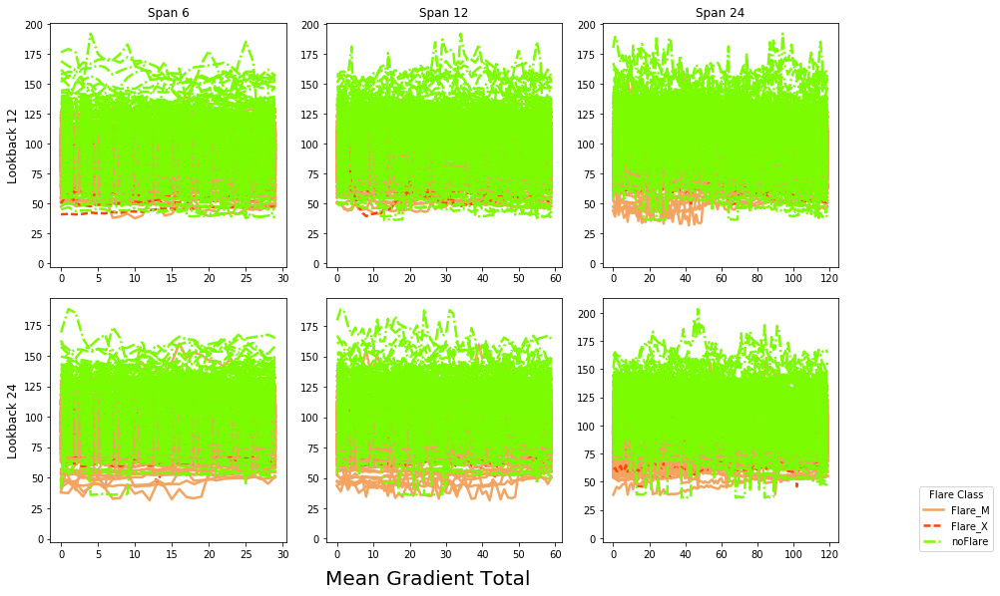

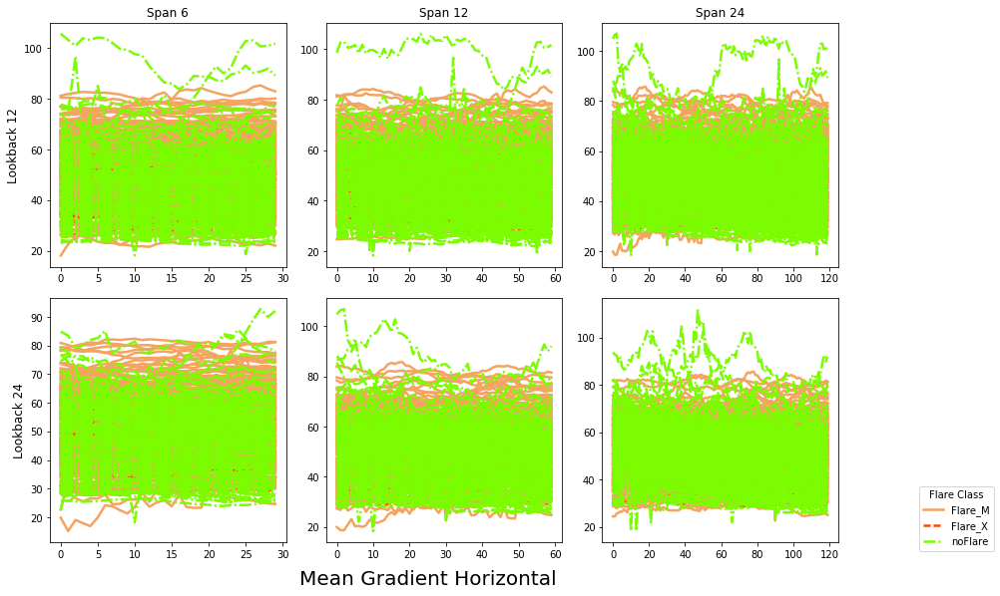

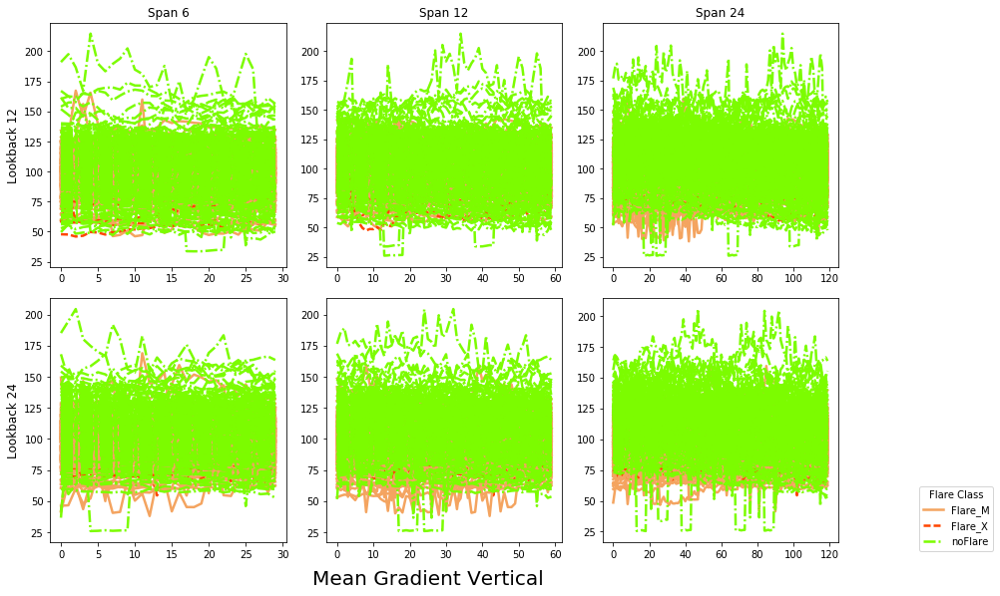

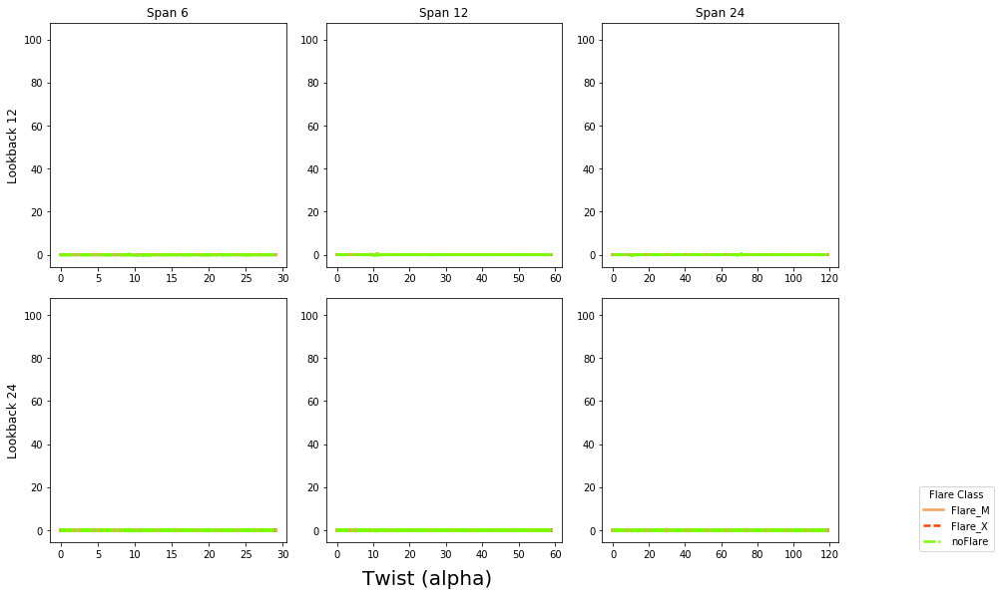

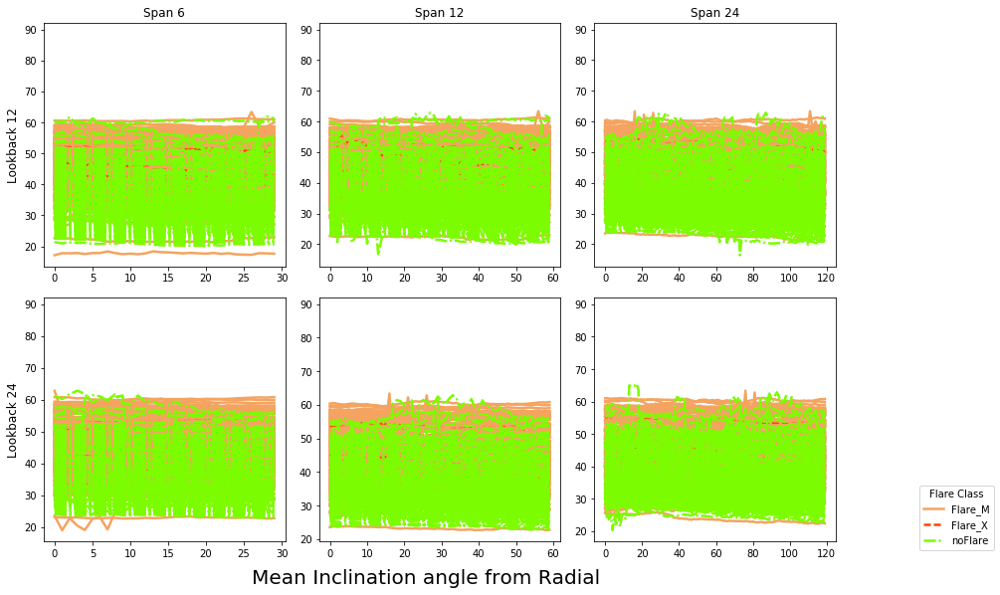

...

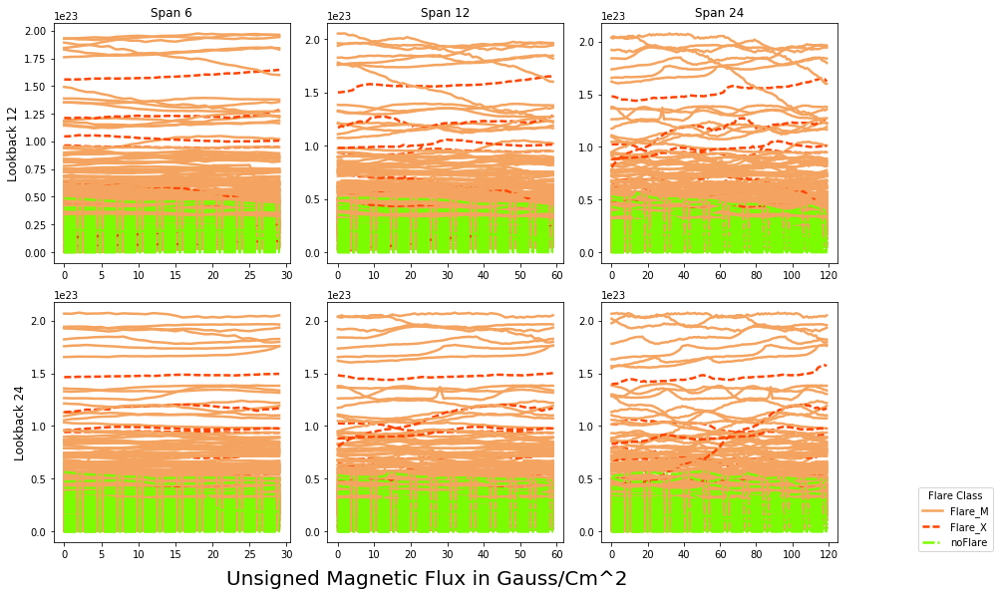

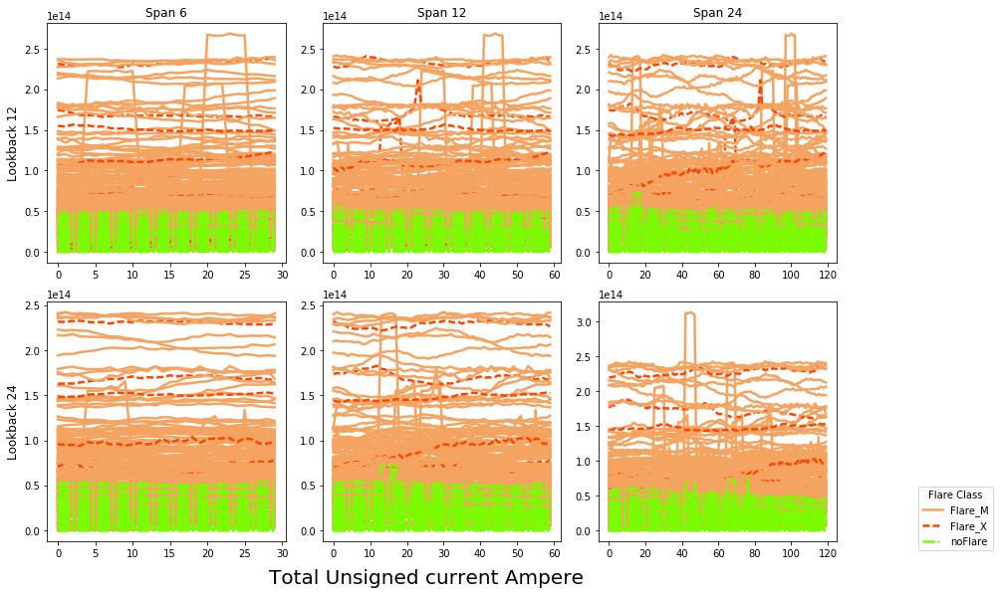

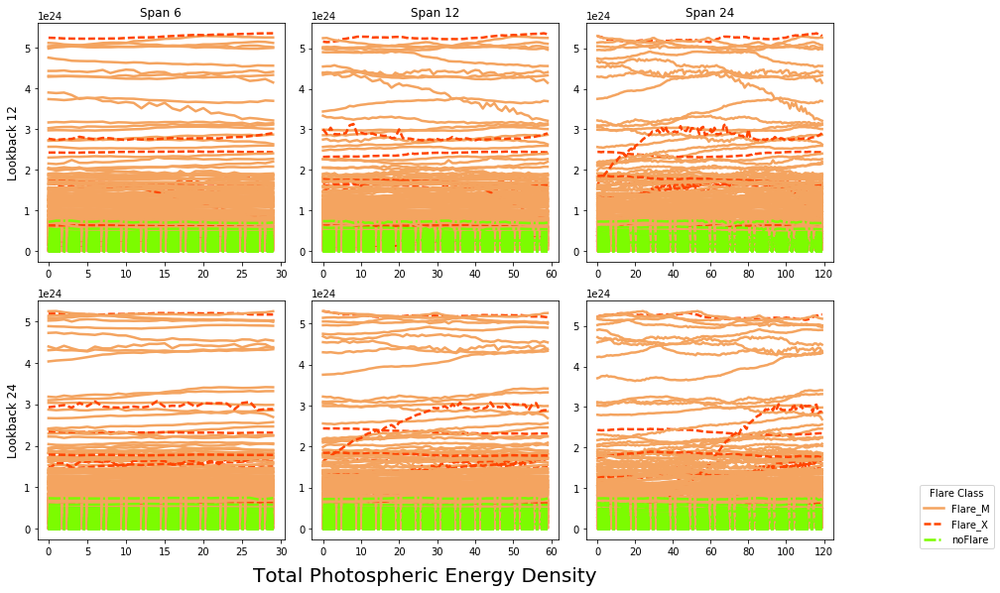

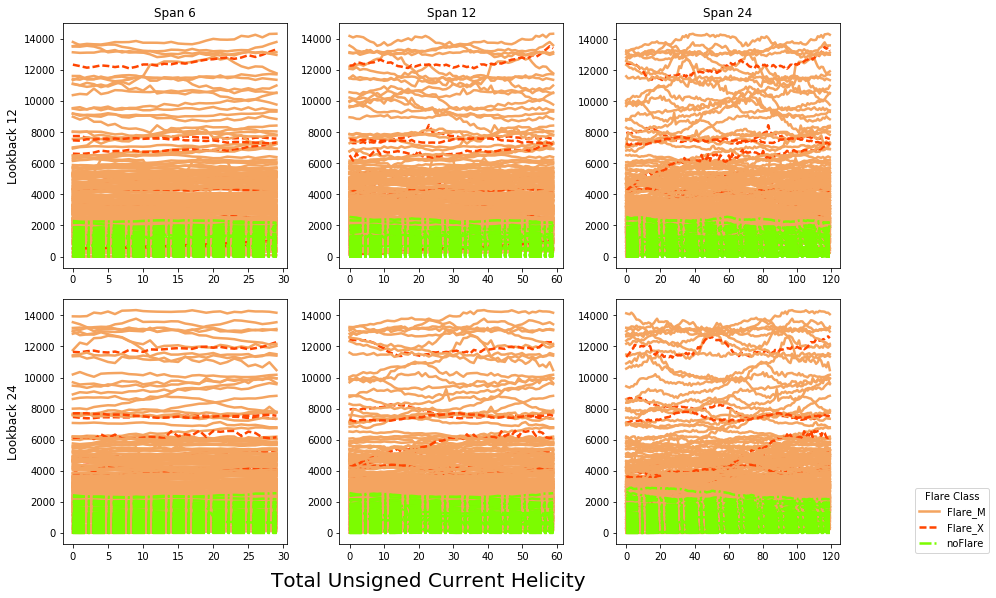

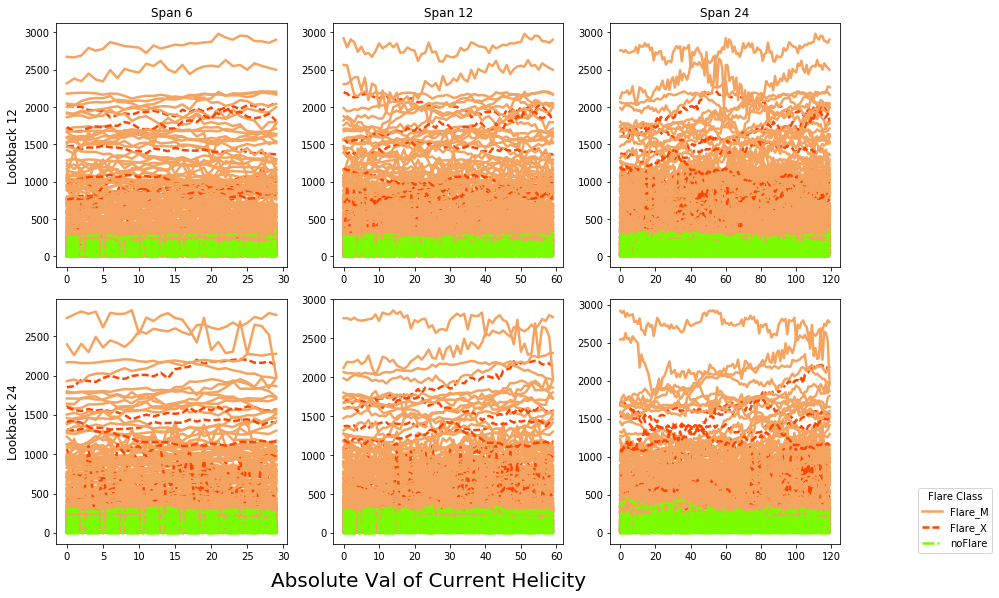

In [340]:
for feat in features:
    plotFeat(ar_data,feat)


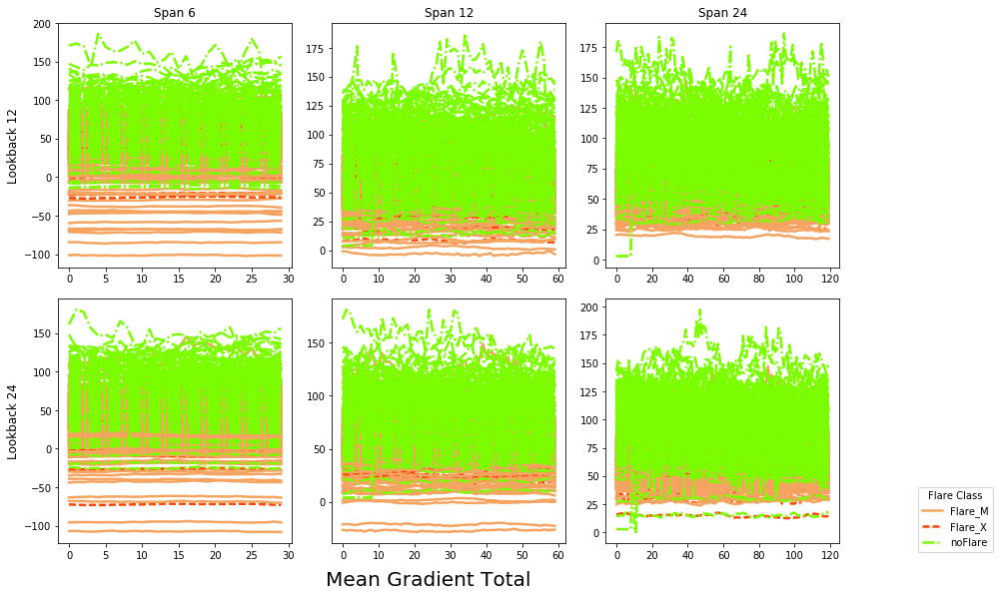

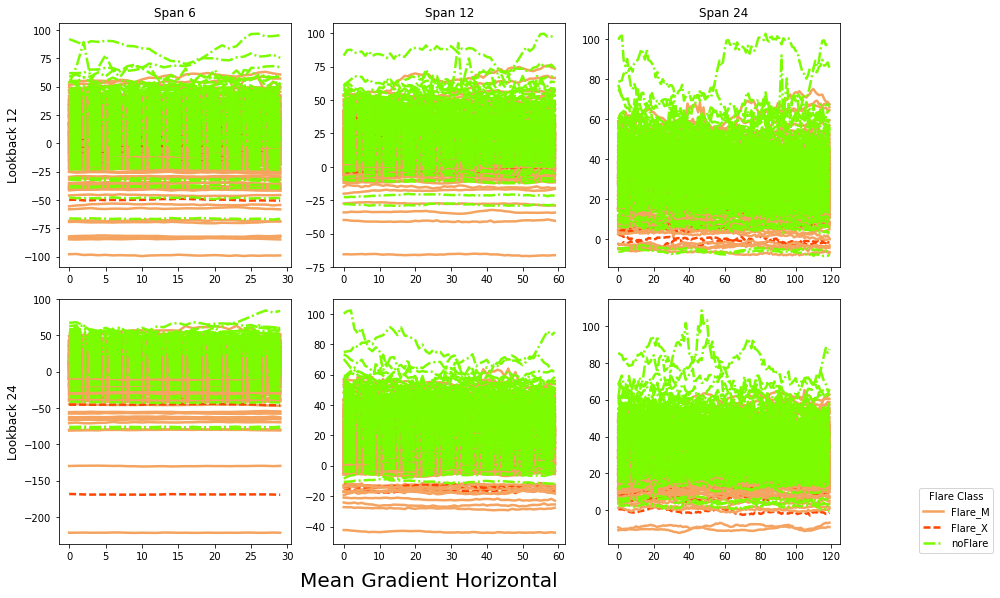

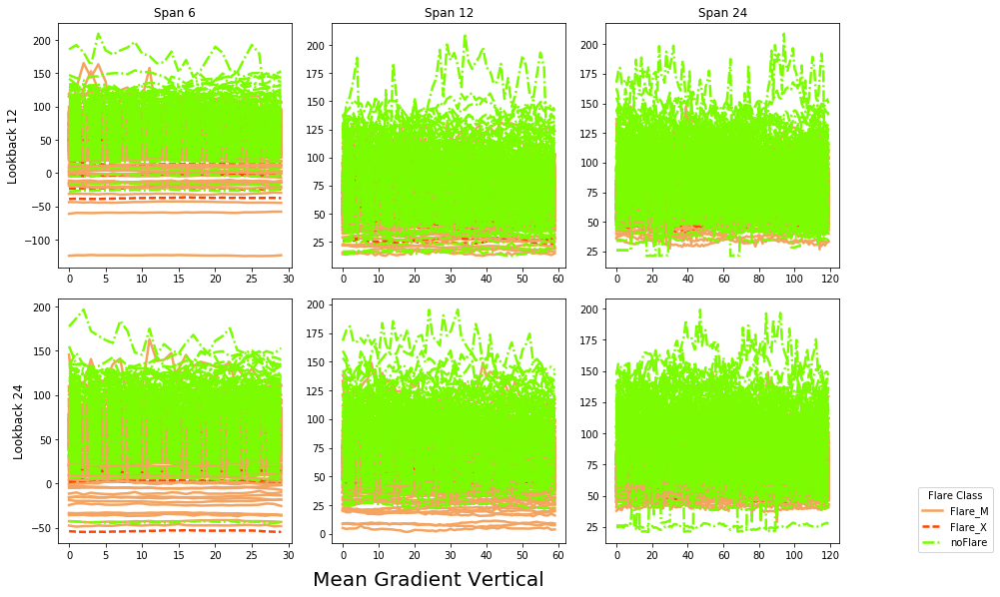

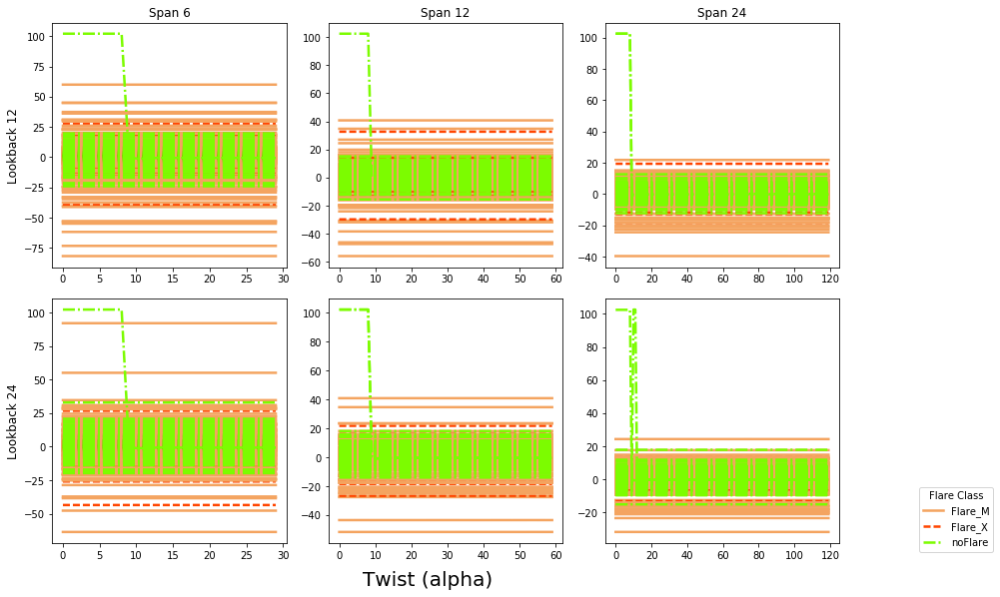

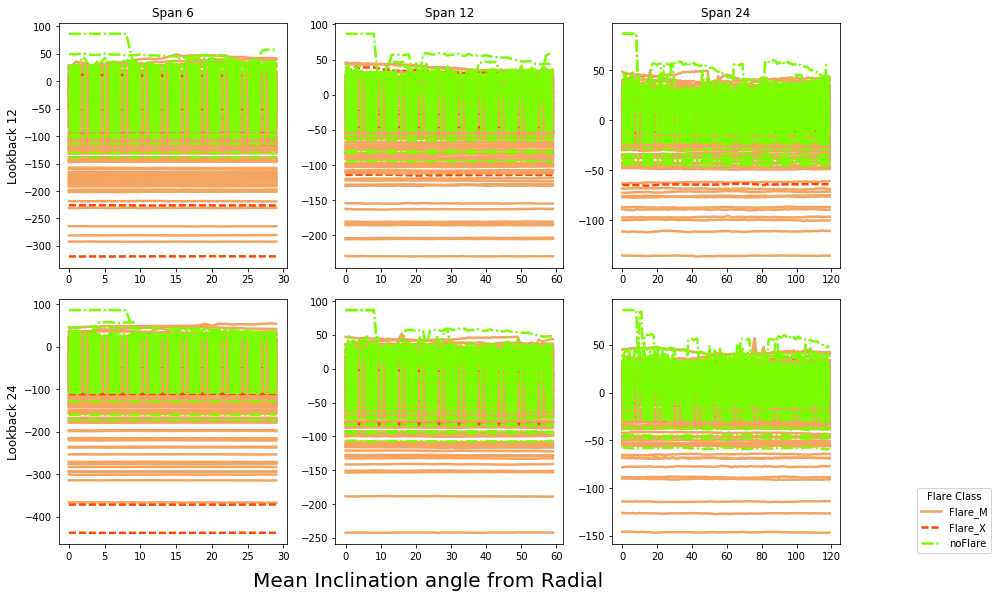

...

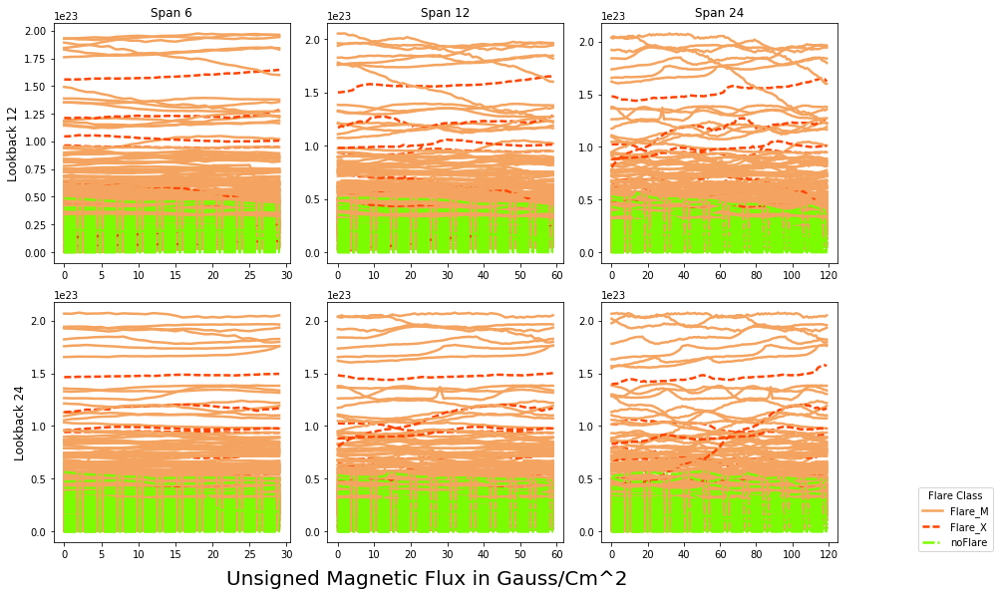

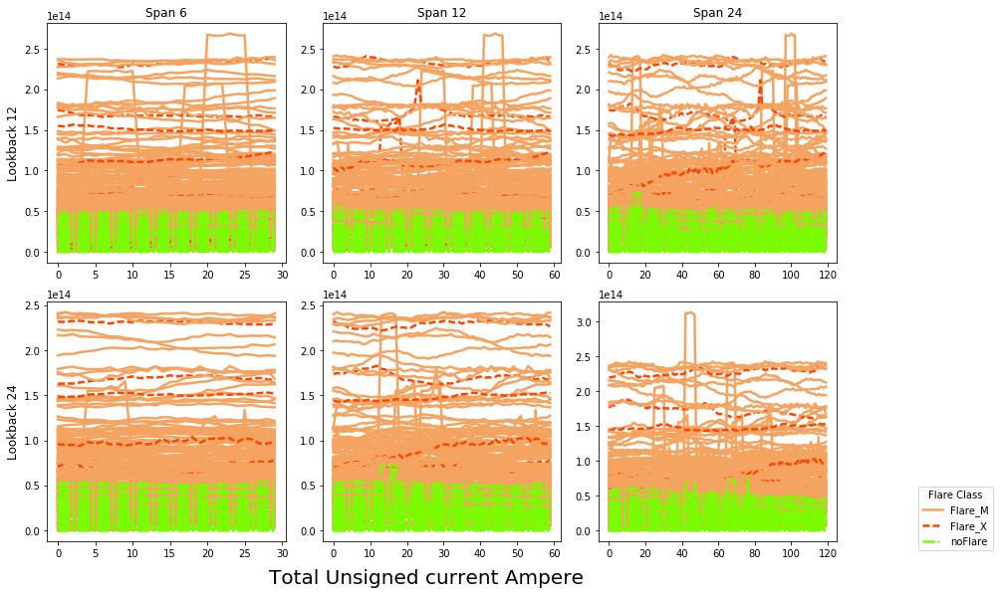

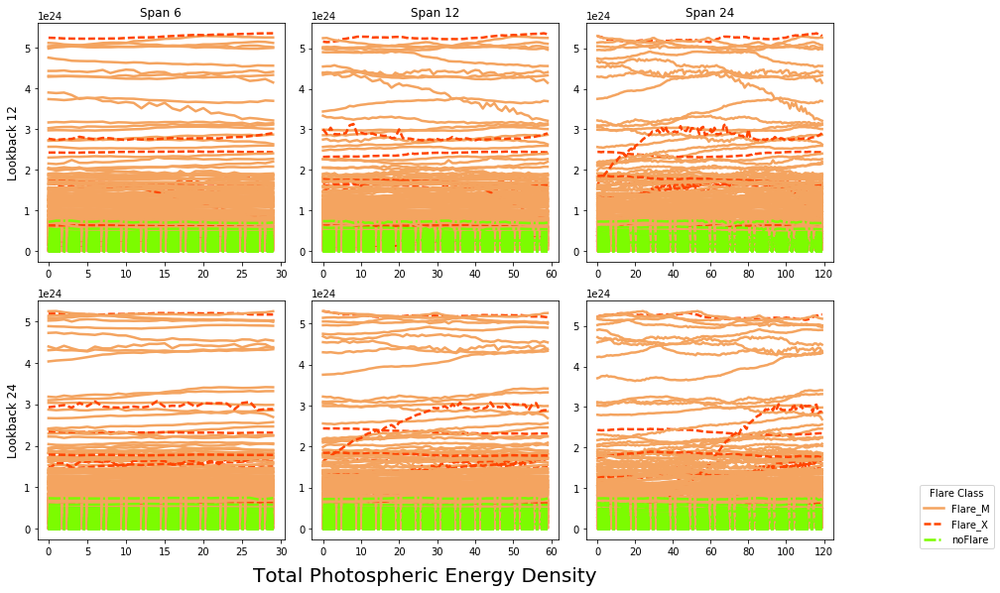

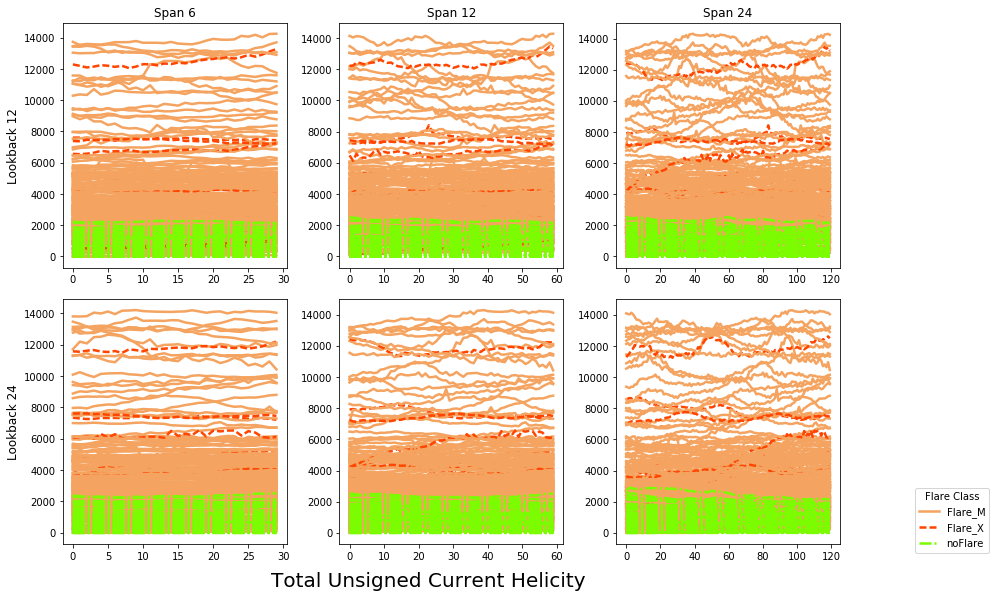

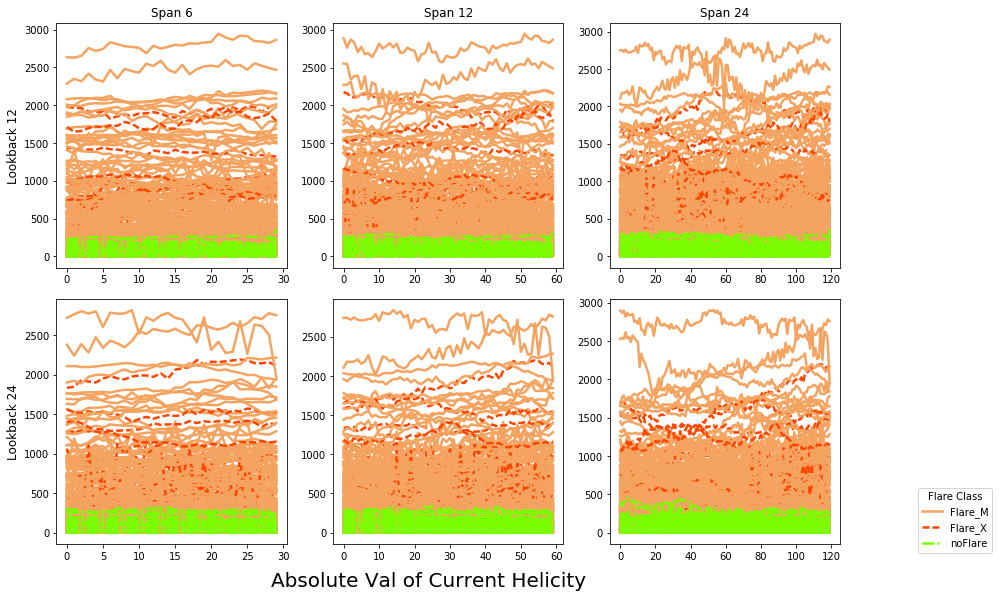

In [341]:
for feat in features:
    plotFeat(ar_data_z_normal,feat)



### Data Preprocessing

##### Missing Value Imputation

In [25]:
def countMissingValues(ar_data):
    total=0
    for key in ar_data.keys():
        df=ar_data[key]
        nullCount = count_nonzero(df.isnull().values.ravel())
        total+=nullCount
    print 'Total Missing points ' + str(total)

In [26]:
ar_data_fillna=od()
for key in ar_data.keys():
    ar_data_fillna[key]=ar_data[key].fillna(method='ffill').fillna(method='bfill')

In [27]:
countMissingValues(ar_data)
countMissingValues(ar_data_fillna)

Total Missing points 1601
Total Missing points 0


#### Normalization of Data

In [28]:
ar_data_z_normal=od()
for key in ar_data_fillna.keys():
    ar_data_z_normal[key]=ar_data_fillna[key].apply(lambda x: (x-(x.mean())/x.std()))

### Sampling Data

In [430]:
X=pd.DataFrame()
y=pd.DataFrame()

#Lookback 12 Span 6
for key in dd_l12_s6.values:
    df=ar_data_z_normal[key[0],key[1],key[2],key[3],key[4],key[5], key[6], key[7], key[8]]
    ff=pd.DataFrame(data=df.mean()).transpose()
    ff.columns = [str(col) + '_mean' for col in ff.columns]

    sf=pd.DataFrame(data=df.var()).transpose()
    sf.columns = [str(col) + '_var' for col in sf.columns]

    tf=pd.DataFrame(data=df.skew()).transpose()
    tf.columns = [str(col) + '_skew' for col in tf.columns]

    qf=pd.DataFrame(data=df.apply(kurtosis)).transpose()
    qf.columns = [str(col) + '_curt' for col in qf.columns]
    
    X=X.append([pd.concat([ff,sf,tf,qf],axis=1)])
    
y=pd.DataFrame(dd_l12_s6['event_type'].apply(lambda x: 1 if x=='flare' else 0))
X.index = arange(len(dd_l12_s6.index)) 
y.index = X.index    
X_l12_s6=X
y_l12_s6=y

X=pd.DataFrame()
y=pd.DataFrame()

#Lookback 12 Span 12
for key in dd_l12_s12.values:
    df=ar_data_z_normal[key[0],key[1],key[2],key[3],key[4],key[5], key[6], key[7], key[8]]
    ff=pd.DataFrame(data=df.mean()).transpose()
    ff.columns = [str(col) + '_mean' for col in ff.columns]

    sf=pd.DataFrame(data=df.var()).transpose()
    sf.columns = [str(col) + '_var' for col in sf.columns]

    tf=pd.DataFrame(data=df.skew()).transpose()
    tf.columns = [str(col) + '_skew' for col in tf.columns]

    qf=pd.DataFrame(data=df.apply(kurtosis)).transpose()
    qf.columns = [str(col) + '_curt' for col in qf.columns]
    
    X=X.append([pd.concat([ff,sf,tf,qf],axis=1)])
    
y=pd.DataFrame(dd_l12_s12['event_type'].apply(lambda x: 1 if x=='flare' else 0))
X.index = arange(len(dd_l12_s12.index)) 
y.index = X.index   
X_l12_s12=X
y_l12_s12=y


X=pd.DataFrame()
y=pd.DataFrame()

#Lookback 12 Span 24
for key in dd_l12_s24.values:
    df=ar_data_z_normal[key[0],key[1],key[2],key[3],key[4],key[5], key[6], key[7], key[8]]
    ff=pd.DataFrame(data=df.mean()).transpose()
    ff.columns = [str(col) + '_mean' for col in ff.columns]

    sf=pd.DataFrame(data=df.var()).transpose()
    sf.columns = [str(col) + '_var' for col in sf.columns]

    tf=pd.DataFrame(data=df.skew()).transpose()
    tf.columns = [str(col) + '_skew' for col in tf.columns]

    qf=pd.DataFrame(data=df.apply(kurtosis)).transpose()
    qf.columns = [str(col) + '_curt' for col in qf.columns]
    
    X=X.append([pd.concat([ff,sf,tf,qf],axis=1)])

y=pd.DataFrame(dd_l12_s24['event_type'].apply(lambda x: 1 if x=='flare' else 0))
X.index = arange(len(dd_l12_s24.index)) 
y.index = X.index   
X_l12_s24=X
y_l12_s24=y

X=pd.DataFrame()
y=pd.DataFrame()

#Lookback 24 Span 6
for key in dd_l24_s6.values:
    df=ar_data_z_normal[key[0],key[1],key[2],key[3],key[4],key[5], key[6], key[7], key[8]]
    ff=pd.DataFrame(data=df.mean()).transpose()
    ff.columns = [str(col) + '_mean' for col in ff.columns]

    sf=pd.DataFrame(data=df.var()).transpose()
    sf.columns = [str(col) + '_var' for col in sf.columns]

    tf=pd.DataFrame(data=df.skew()).transpose()
    tf.columns = [str(col) + '_skew' for col in tf.columns]

    qf=pd.DataFrame(data=df.apply(kurtosis)).transpose()
    qf.columns = [str(col) + '_curt' for col in qf.columns]
    
    X=X.append([pd.concat([ff,sf,tf,qf],axis=1)])
y=pd.DataFrame(dd_l24_s6['event_type'].apply(lambda x: 1 if x=='flare' else 0))
X.index = arange(len(dd_l24_s6.index)) 
y.index = X.index
X_l24_s6=X
y_l24_s6=y


X=pd.DataFrame()
y=pd.DataFrame()

#Lookback 24 Span 12
for key in dd_l24_s12.values:
    df=ar_data_z_normal[key[0],key[1],key[2],key[3],key[4],key[5], key[6], key[7], key[8]]
    ff=pd.DataFrame(data=df.mean()).transpose()
    ff.columns = [str(col) + '_mean' for col in ff.columns]

    sf=pd.DataFrame(data=df.var()).transpose()
    sf.columns = [str(col) + '_var' for col in sf.columns]

    tf=pd.DataFrame(data=df.skew()).transpose()
    tf.columns = [str(col) + '_skew' for col in tf.columns]

    qf=pd.DataFrame(data=df.apply(kurtosis)).transpose()
    qf.columns = [str(col) + '_curt' for col in qf.columns]
    
    X=X.append([pd.concat([ff,sf,tf,qf],axis=1)])
    
y=pd.DataFrame(dd_l24_s12['event_type'].apply(lambda x: 1 if x=='flare' else 0))
X.index = arange(len(dd_l24_s12.index)) 
y.index = X.index
X_l24_s12=X
y_l24_s12=y



X=pd.DataFrame()
y=pd.DataFrame()

#Lookback 24 Span 24
for key in dd_l24_s24.values:
    df=ar_data_z_normal[key[0],key[1],key[2],key[3],key[4],key[5], key[6], key[7], key[8]]
    ff=pd.DataFrame(data=df.mean()).transpose()
    ff.columns = [str(col) + '_mean' for col in ff.columns]

    sf=pd.DataFrame(data=df.var()).transpose()
    sf.columns = [str(col) + '_var' for col in sf.columns]

    tf=pd.DataFrame(data=df.skew()).transpose()
    tf.columns = [str(col) + '_skew' for col in tf.columns]

    qf=pd.DataFrame(data=df.apply(kurtosis)).transpose()
    qf.columns = [str(col) + '_curt' for col in qf.columns]
    
    X=X.append([pd.concat([ff,sf,tf,qf],axis=1)])

y = pd.DataFrame(dd_l24_s24['event_type'].apply(lambda x: 1 if x=='flare' else 0))

X.index = arange(len(dd_l24_s24.index)) 
y.index = X.index
X_l24_s24=X
y_l24_s24=y

#### Model Selection

In [365]:
y = pd.DataFrame(dd_l24_s24['flare_class'].apply(lambda x: 1 if x=='X' else 0))
Y = pd.DataFrame(dd_l24_s24['flare_class'].apply(lambda x: 1 if x=='X' else 0)) + pd.DataFrame(dd_l24_s24['event_type'].apply(lambda x: 1 if x=='flare' else 0))
Y.add(y)

,event_type,flare_class
4,NaN,NaN
10,NaN,NaN
16,NaN,NaN
22,NaN,NaN
28,NaN,NaN
34,NaN,NaN
40,NaN,NaN
46,NaN,NaN
52,NaN,NaN
58,NaN,NaN


In [573]:
def compareClf(X,Y):
    import pandas
    import matplotlib.pyplot as plt
    from sklearn import model_selection
    from sklearn.linear_model import LogisticRegression
    from sklearn.neighbors import KNeighborsClassifier
    from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
    from sklearn.naive_bayes import GaussianNB
    from sklearn.svm import SVC
      # prepare configuration for cross validation test harness
    seed = 1234
    # prepare models
    models = []
    models.append(('LR', LogisticRegression()))
    models.append(('LDA', LinearDiscriminantAnalysis()))
    models.append(('KNN', KNeighborsClassifier()))
    models.append(('NB', GaussianNB()))
  #  models.append(('SVM', SVC()))
    
    # evaluate each model in turn
    results = []
    names = []
    scoring = 'accuracy'
    for name, model in models:
        kfold = model_selection.KFold(n_splits=10, random_state=seed)
        cv_results = model_selection.cross_val_score(model, X, Y, cv=kfold, scoring=scoring)
        results.append(cv_results)
        names.append(name)
        msg = "%s: %f (%f)" % (name, cv_results.mean(), cv_results.std())
        print(msg)
    # boxplot algorithm comparison
    fig = plt.figure()
    #fig.suptitle('Algorithm Comparison')
    ax = fig.add_subplot(111)
    plt.boxplot(results)
    ax.set_xticklabels(names)
    plt.show()

LR: 0.661869 (0.278749)
LDA: 0.856162 (0.060733)
KNN: 0.815455 (0.095661)
NB: 0.716313 (0.264650)


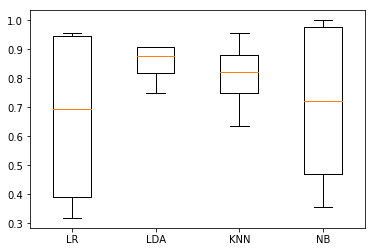

LR: 0.642125 (0.318979)
LDA: 0.873044 (0.060350)
KNN: 0.819239 (0.077062)
NB: 0.691279 (0.292988)


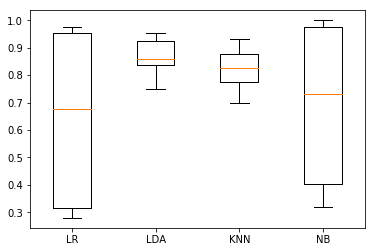

LR: 0.669396 (0.228797)
LDA: 0.856620 (0.051053)
KNN: 0.844657 (0.055272)
NB: 0.709524 (0.276190)


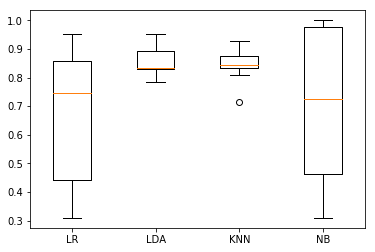

LR: 0.656645 (0.259730)
LDA: 0.859911 (0.050761)
KNN: 0.855205 (0.045252)
NB: 0.620930 (0.373840)


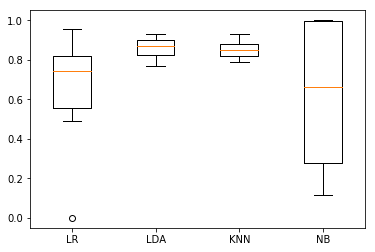

LR: 0.635714 (0.305848)
LDA: 0.819048 (0.063174)
KNN: 0.864286 (0.028272)
NB: 0.714286 (0.276642)


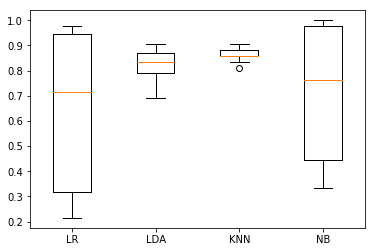

LR: 0.502805 (0.464686)
LDA: 0.820915 (0.081934)
KNN: 0.865854 (0.042550)
NB: 0.762561 (0.231921)


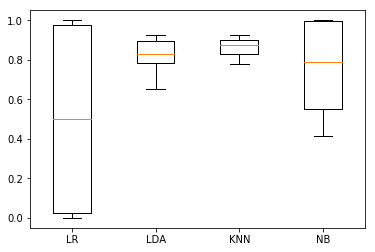

In [574]:
compareClf(X_l12_s6,y_l12_s6)
compareClf(X_l12_s12,y_l12_s12)
compareClf(X_l12_s24,y_l12_s24)
compareClf(X_l24_s6,y_l24_s6)
compareClf(X_l24_s12,y_l24_s12)
compareClf(X_l24_s24,y_l24_s24)

In [569]:
X=X_l12_s12
y=y_l12_s12
from sklearn.cross_validation import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

In [570]:
from sklearn.svm import SVC
estimator = SVC()

In [571]:
from sklearn.cross_validation import ShuffleSplit
cv = ShuffleSplit(X_train.shape[0], n_iter=10, test_size=0.4, random_state=0)

In [572]:
from sklearn.grid_search import GridSearchCV
import numpy as np
gammas = np.logspace(-6, -1, 20)
classifier = GridSearchCV(estimator=estimator, cv=cv, param_grid=dict(gamma=gammas),scoring='roc_auc')
classifier.fit(X_train, y_train)
y_pred = classifier.predict(X_test)

In [534]:
from sklearn.metrics import accuracy_score
accuracy_score(y_test, classifier.predict(X_test), normalize=True)

0.45977011494252873

In [563]:
from sklearn.neural_network import MLPClassifier
estimator = MLPClassifier(solver='lbfgs', alpha=1e-5, hidden_layer_sizes=(7, 5), random_state=1)
classifier = GridSearchCV(estimator=estimator, cv=cv, param_grid=dict(hidden_layer_sizes=[(10,10)]),scoring='roc_auc')
classifier.fit(X_train, y_train)
accuracy_score(y_test, classifier.predict(X_test), normalize=True) 

0.54022988505747127

In [566]:
np.logspace(-6, -1, 20)

array([  1.00000000e-06,   1.83298071e-06,   3.35981829e-06,
         6.15848211e-06,   1.12883789e-05,   2.06913808e-05,
         3.79269019e-05,   6.95192796e-05,   1.27427499e-04,
         2.33572147e-04,   4.28133240e-04,   7.84759970e-04,
         1.43844989e-03,   2.63665090e-03,   4.83293024e-03,
         8.85866790e-03,   1.62377674e-02,   2.97635144e-02,
         5.45559478e-02,   1.00000000e-01])

#### Total Time Series

In [319]:
print u'Total ' + str(len(dd)) + u' Time Series'

Total 2544 Time Series


#### Type of Series

In [320]:
print u'List of events '+str(dd.event_type.unique())

List of events [u'flare' u'noflare']


#### Year

In [321]:
print u'List of event years '+str(dd.event_year.unique())

List of event years [2011 2012 2013 2014 2015 2016]


#### Month

In [322]:
print u'List of event months '+str(dd.event_month.unique())

List of event months [ 1  2  3  4  5  7  8  9 10 11 12  6]


#### Days

In [323]:
print u'List of event day of the month '+str(dd.event_day.unique())

List of event day of the month [28 14 16 18  7  8  9 24 22 29 27  3  4  5  6 21 23 25 26 30  2 15 31 13 17
  1 12 19 11 10 20]


### Flare Class

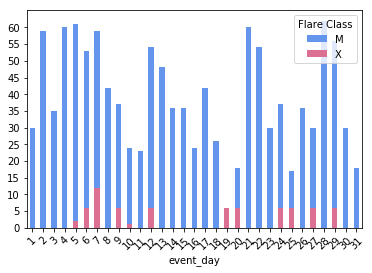

In [324]:
dd.pivot_table(values=['event'],index=['event_day'],columns=['flare_class'], aggfunc=lambda x: len(x)/2,fill_value=0).M.plot(kind='bar',color='cornflowerblue',label='M')
dd.pivot_table(values=['event'],index=['event_day'],columns=['flare_class'], aggfunc=lambda x: len(x)/2,fill_value=0).X.plot(kind='bar',color='palevioletred',label='X')
plt.xticks(rotation=45)
plt.yticks(arange(0,65,5))
plt.legend(title='Flare Class',loc='upper right')
plt.show()

#### Distinct Flare Events
 Grouped by lookback hours and span hours, indexed on flare class

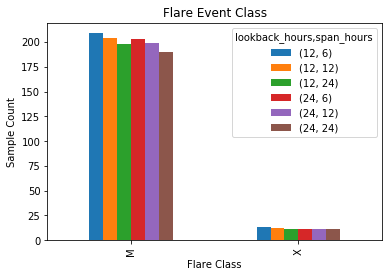

In [314]:
dd.pivot_table(values=['event'],index=['flare_class'],columns=['lookback_hours','span_hours'] ,aggfunc=lambda x: len(x)/2,fill_value=0).plot(kind='bar')
plt.xlabel("Flare Class")
plt.ylabel("Sample Count")
plt.title("Flare Event Class")
plt.show()

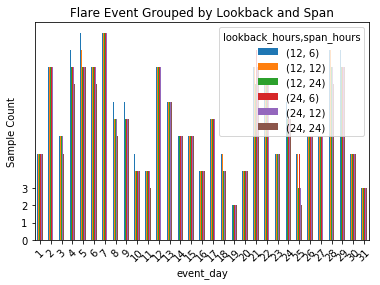

In [33]:
dd.pivot_table(values=['event'],index=['event_day'],columns=['lookback_hours','span_hours'] ,aggfunc=lambda x: len(x)/2,fill_value=0).plot(kind='bar')
plt.ylabel("Sample Count")
plt.xticks(rotation=45)
plt.yticks(arange(0, 4, 1.0))
plt.title("Flare Event Grouped by Lookback and Span")
plt.show()

#### Distinct Flare Events
Grouped by lookback hours and span hours, indexed on flare class and day of month 

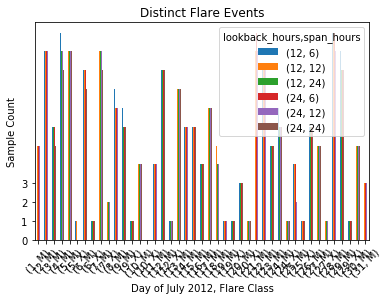

In [37]:
dd.pivot_table(values=['event'],index=['event_day','flare_class'],columns=['lookback_hours','span_hours'] ,aggfunc=lambda x: len(x)/2,fill_value=0).plot(kind='bar')
plt.xticks(rotation=45)
plt.yticks(arange(0, 4, 1.0))
plt.xlabel("Day of July 2012, Flare Class")
plt.ylabel("Sample Count")
plt.title("Distinct Flare Events")
plt.show()

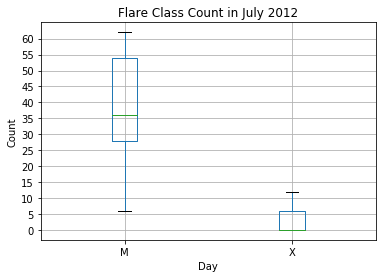

In [334]:
dd.pivot_table(values=['event'],index=['event_day'],columns=['flare_class'], aggfunc=lambda x: len(x)/2,fill_value=0).boxplot()
plt.title("Flare Class Count in July 2012")
plt.xlabel("Day")
plt.ylabel("Count")
plt.yticks(arange(0, 65, 5))
plt.legend(loc='upper right')
plt.show()

In [43]:
dd.pivot_table(values=['event'],index=['event_day'],columns=['flare_class'], aggfunc=lambda x: len(x)/2,fill_value=0)

flare_class,M,X
event_day,,
1,30,0
2,59,0
3,35,0
4,60,0
5,61,2
6,53,6
7,59,12
8,42,0
9,37,6


In [44]:
color=['r','g','b']
col = 0
prior_col = -3
event_type = ['flare','noflare']
prior=12
day=10
for key in ar_data.keys():
    for feature in ar_data[key].columns:
        if key[0]=='flare':
            plt.plot(ar_data[key].index,list(ar_data[key][feature]),color[0],label=feature,linewidth=2.5,linestyle="-")
        if key[0]=='noflare':
            plt.plot(ar_data[key].index,list(ar_data[key][feature]),color[1],label=feature,linewidth=2.5,linestyle="-")

plt.show()


KeyboardInterrupt: 

In [98]:
ar_data[key].columns

Index([u'Mean Gradient Total', u'Mean Gradient Horizontal',
       u'Mean Gradient Vertical', u'Twist (alpha)',
       u'Mean Inclination angle from Radial',
       u'Mean Photospheric Magnetic Free Energy', u'Mean Shear Angle',
       u'Fraction Area Shear gt 45 deg', u'Mean Vertical Current Density',
       u'Unsigned Magnetic Flux in Gauss/Cm^2',
       u'Total Unsigned current Ampere', u'Total Photospheric Energy Density',
       u'Total Unsigned Current Helicity',
       u'Absolute Val of Current Helicity'],
      dtype='object')

In [99]:
span=6 #6 hours, 12 hours, 24 hours
lookback=12 #12 hours, 24 hours
labels = ar_data.values()[0].columns
color=['b','g','r','c','y','k','w']

print feature_names
for key in ar_data.keys():
        if(key[0]==u'flare' and key[-2]==span and key[-3]==lookback):
                x = ar_data[key].index
                y = ar_data[key][:1-]
                for y_arr, label in zip(y, labels):
                    plt.plot(x, y_arr, label=label)
                    plt.legend()
                    plt.show()


SyntaxError: invalid syntax (<ipython-input-99-7d1ddd6a124a>, line 10)

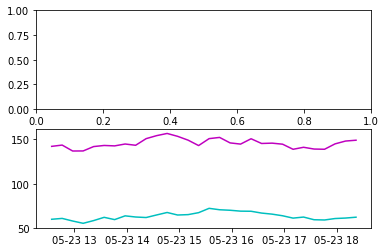

In [100]:
def f(t):
    return np.exp(-t) * np.cos(2*np.pi*t)

plt.figure(1)
plt.subplot(211)
#plt.plot(ar_data[key], ar_data[key], 'bo', ar_data[key], f(ar_data[key]), 'k')
plt.subplot(212)
TS1=plt.plot(ar_data[key][features[0]].index, ar_data[key][features[0]], 'm-',label='askdaks')
TS2=plt.plot(ar_data[key][features[1]].index, ar_data[key][features[1]], 'c-',label='booahhhaha')
# Create another legend for the second line.
plt.show()


In [ ]:
i=0
for feature in features:
    i+=1
    print i
    plt.subplot(410+((i%4)+1))
    j=0
    for key in ar_data.keys():
        j+=1
        plt.subplot(111)
        if key[0]==u'flare':
            plt.plot(ar_data[key][feature].index,ar_data[key][feature], label=feature,'-')
        else:
            plt.plot(ar_data[key][feature].index,ar_data[key][feature], label=feature,'*')

# Place a legend above this subplot, expanding itself to
# fully use the given bounding box.
plt.legend(bbox_to_anchor=(1, 1, 0, 0))


plt.show()

In [ ]:
ar_data[key].scatterplot()

In [ ]:
for feature in features:
    i+=1
    print i
    plt.plot(ar_data[key][feature].index,ar_data[key][feature], label=feature)
plt.show()

In [ ]:
import matplotlib.pyplot as plt
x=[[1,2,3,4],[1,2,3,4],[1,2,3,4],[1,2,3,4]]
y=[[1,2,3,4],[2,3,4,5],[3,4,5,6],[7,8,9,10]]
colours=['r','g','b','k']
for i in range(len(x)):
    plt.plot(x[i],y[i],colours[i]) 
    

In [ ]:
import pylab
beta=[3,6,9]
# random data generation
y =random.random(100)*100 
for i in range(100):
 y[i]=y[i]+i**((150-i)/80.0) # modifies the trend

# smoothing the data
pylab.figure(1)
pylab.plot(y,'-k',label="original signal",alpha=.3)
for b in beta:
 yy = smooth(y,b) 
 pylab.plot(yy,label="filtered (beta = "+str(b)+")")
pylab.legend()
pylab.show()

In [ ]:
for key in ar_data.keys():
    print int(key.index)

In [ ]:
def smooth(x,beta):
 """ kaiser window smoothing """
 window_len=11
 # extending the data at beginning and at the end
 # to apply the window at the borders
 s = r_[x[window_len-1:0:-1],x,x[-1:-window_len:-1]]
 w = kaiser(window_len,beta)
 y = convolve(w/w.sum(),s,mode='valid')
 return y[5:len(y)-5]

In [511]:
median 		= lambda data: data[len(data)/2]
mean 		= lambda data: float(sum(data)/len(data))
hi_low		= lambda data: (data[0], data[len(data)-1])
variance 	= lambda data, avg: sum([x**2 for x in [i-avg for i in data]])/float(len(data))
std_dev 	= lambda data: math.sqrt(variance(data, mean(data)))

In [143]:
ar_data[key].apply(std_dev)

Mean Gradient Total                       3.650208e+00
Mean Gradient Horizontal                  1.038144e+00
Mean Gradient Vertical                    2.634931e+00
Twist (alpha)                             6.697806e-03
Mean Inclination angle from Radial        5.171773e-01
Mean Photospheric Magnetic Free Energy    4.719605e+02
Mean Shear Angle                                   NaN
Fraction Area Shear gt 45 deg             7.395576e-01
Mean Vertical Current Density             3.992451e-02
Unsigned Magnetic Flux in Gauss/Cm^2      3.715281e+21
Total Unsigned current Ampere             5.126390e+12
Total Photospheric Energy Density         7.607022e+22
Total Unsigned Current Helicity           3.304829e+02
Absolute Val of Current Helicity          1.154098e+02
dtype: float64

#### Missing Values

In [463]:
def missingValues(ar_data):
    total=0
    for key in ar_data.keys():
        df=ar_data[key]
        nullCount = count_nonzero(df.isnull().values.ravel())
        total+=nullCount
    print 'Total Missing points ' + str(total)

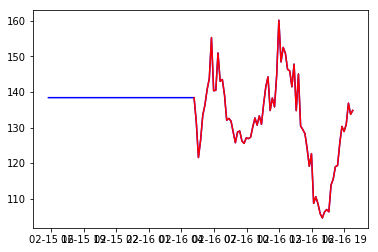

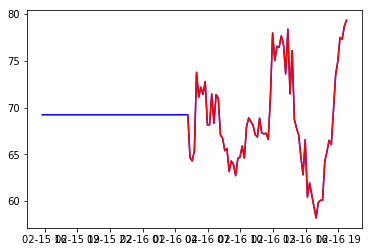

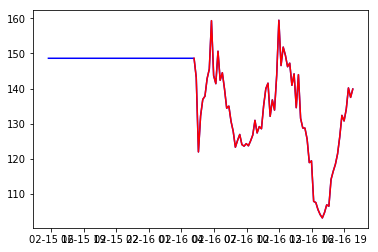

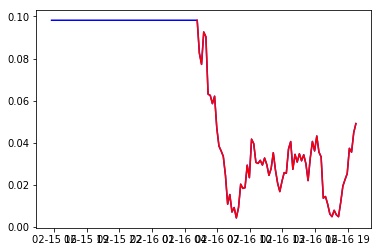

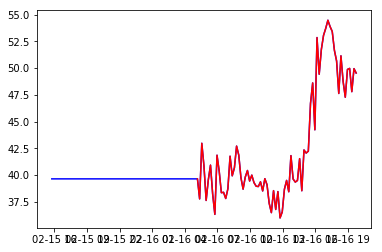

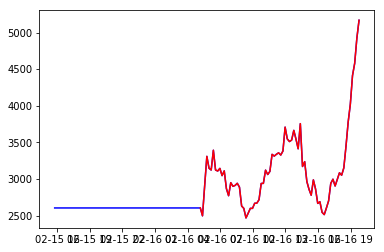

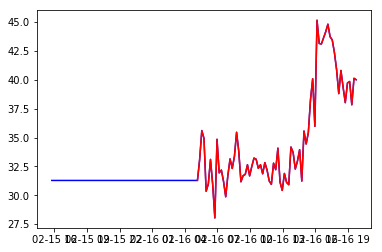

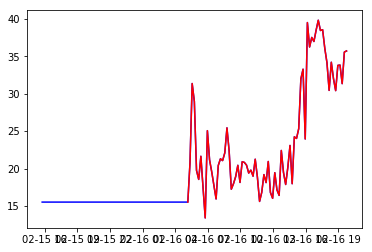

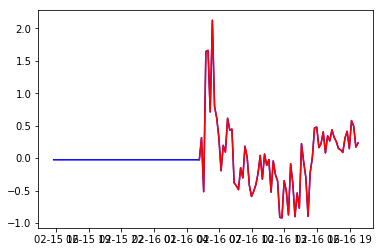

In [411]:
key=(u'flare', 2013, 2, 17, 15, 45, 24, 24, u'M')
nullCount = count_nonzero(ar_data[key].isnull().values.ravel())
if nullCount!=0:
    missingColumns=ar_data[key].columns[ar_data[key].isnull().any()].tolist()
    df=ar_data[key]
    df_fillna=ar_data_fillna[key]
    for idx, col   in enumerate(missingColumns):
        plt.plot(df_fillna[col],color='blue',linestyle="-")
        plt.plot(df[col],color='red',linestyle="-")
        plt.show() 

In [410]:
plt.show()

In [513]:
count_nonzero(df.isnull().values.ravel())
data = df.fillna(method='ffill').fillna(method='bfill')

In [514]:
count_nonzero(data.isnull().values.ravel())

0

In [515]:
df.plot()

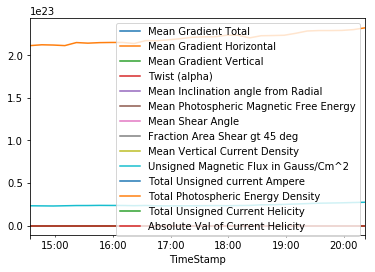

In [516]:
plt.show()

In [218]:
missingColumns=df.columns[df.isnull().any()].tolist()
plt.plot(data[missingColumns],color='red')
plt.plot(df[missingColumns],color='blue')

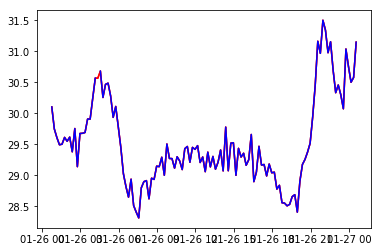

In [219]:
plt.show()

In [325]:
dd

,event_type,event_year,event_month,event_day,event_hour,event_minute,lookback_hours,span_hours,flare_class
0,flare,2011,1,28,0,44,12,12,M
1,flare,2011,1,28,0,44,12,24,M
2,flare,2011,1,28,0,44,12,6,M
3,flare,2011,1,28,0,44,24,12,M
4,flare,2011,1,28,0,44,24,24,M
5,flare,2011,1,28,0,44,24,6,M
6,flare,2011,2,14,17,20,12,12,M
7,flare,2011,2,14,17,20,12,24,M
8,flare,2011,2,14,17,20,12,6,M
9,flare,2011,2,14,17,20,24,12,M


In [337]:
print len(X_l12_s6)
print len(X_l12_s12)
print len(X_l12_s24)
print len(X_l24_s6)
print len(X_l24_s12)
print len(X_l24_s24)

444
432
418
428
420
402


In [438]:
def plotROC(X,y):
    import numpy as np
    import matplotlib.pyplot as plt
    from itertools import cycle

    from sklearn import svm, datasets
    from sklearn.metrics import roc_curve, auc
    from sklearn.model_selection import train_test_split
    from sklearn.preprocessing import label_binarize
    from sklearn.multiclass import OneVsRestClassifier
    from scipy import interp


    # Binarize the output
    n_classes = y.shape[1]

    # Add noisy features to make the problem harder
    random_state = np.random.RandomState(0)
    n_samples, n_features = X.shape
    X = np.c_[X, random_state.randn(n_samples, 200 * n_features)]

    # shuffle and split training and test sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.5,
                                                        random_state=0)

    # Learn to predict each class against the other
    classifier = OneVsRestClassifier(svm.SVC(kernel='linear', probability=True,
                                     random_state=random_state))
    y_score = classifier.fit(X_train, y_train).decision_function(X_test)

    # Compute ROC curve and ROC area for each class
    fpr = dict()
    tpr = dict()
    roc_auc = dict()
    for i in range(n_classes):
        fpr[i], tpr[i], _ = roc_curve(y_test[:, i], y_score[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])

    # Compute micro-average ROC curve and ROC area
    fpr["micro"], tpr["micro"], _ = roc_curve(y_test.ravel(), y_score.ravel())
    roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])
    #Plot of a ROC curve for a specific class
    plt.figure()
    lw = 2
    plt.plot(fpr[2], tpr[2], color='darkorange',
             lw=lw, label='ROC curve (area = %0.2f)' % roc_auc[2])
    plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver operating characteristic example')
    plt.legend(loc="lower right")
    plt.show()

In [439]:
plotROC(X_l24_s24,y_l24_s24)

TypeError: unhashable type